In [1]:
import pandas as pd
import pandas_profiling as pp
import numpy as np
%matplotlib inline

In [2]:
import plotly.graph_objs as go
import plotly.offline as py
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
py.init_notebook_mode(connected=True)

In [ ]:
#  pp.ProfileReport(df)

In [3]:
# import data
df = pd.read_csv('data.csv')

In [4]:
# bad review_date
df = df[~df.review_id.isin([815831,815830])]

# Data Clean

In [6]:
# change dates
date_col = ['review_date','short_start_date','long_start_date']
for col in date_col:
    df[col] = pd.to_datetime(df[col])

In [7]:
# create new columns
df["survey_type"] = np.where(df.review_date>=df.long_start_date,"long","short")
df['age'] = (df.review_date - df.short_start_date).dt.days

# Question 1

In [52]:
# long surveys have more review than short overall but  might be because there was more time for long surveys to accumulate
df.survey_type.value_counts().reset_index()

,index,survey_type
0,long,329755
1,short,80656


# Do the “long” surveys result in significantly more reviews than the “short” surveys?

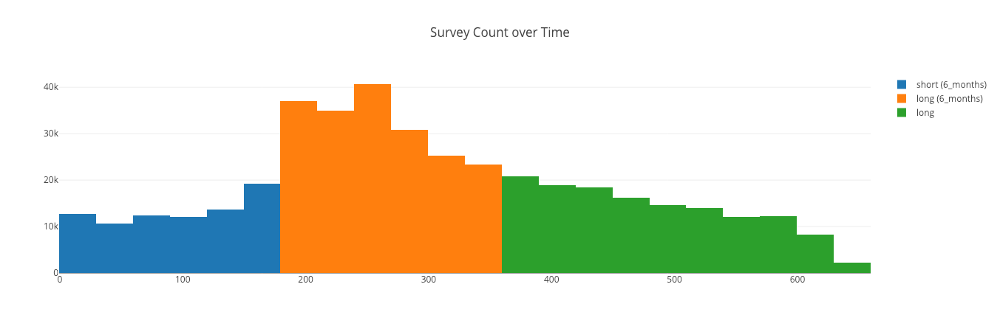

In [10]:
# Frequency of survey by day over time
df['age'] = (df.review_date - df.short_start_date).dt.days

trace1 = go.Histogram(x=df[df.survey_type=='short']['age'],name='short (6_months)',xbins=dict(size=30))
trace2 = go.Histogram(x=df[(df.survey_type=='long')&(df.age>=180)&(df.age<360)]['age'],name='long (6_months)',xbins=dict(size=30))
trace3 = go.Histogram(x=df[(df.survey_type=='long')&(df.age>=360)]['age'],name='long',xbins=dict(size=30))


data = [trace1,trace2,trace3]
layout = go.Layout(title='Survey Count over Time',barmode='overlay')
fig = go.Figure(data,layout)
py.iplot(fig)

In [11]:
# looks like "long" surveys indeed did significantly have more reviews than "short" surveys even when compared on the same time frame
# it's interesting to note that these reviews do tail out

# Which “long” survey has a greater impact (v1 or v2)

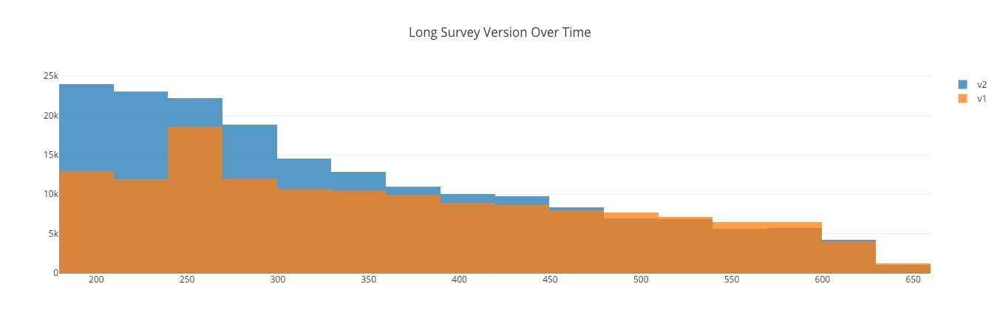

In [39]:
# Which “long” survey has a greater impact (v1 or v2)
trace1 = go.Histogram(x=df[(df.survey_type=='long')&(df.version == 'v1')]['age'],name='v1',xbins=dict(size=30),opacity=0.75)
trace2 = go.Histogram(x=df[(df.survey_type=='long')&(df.version == 'v2')]['age'],name='v2',xbins=dict(size=30),opacity=0.75)

data = [trace2,trace1]
layout = go.Layout(title='Long Survey Version Over Time',barmode='overlay')
fig = go.Figure(data,layout)
py.iplot(fig)

In [156]:
# is this because there are more practices that chose v2?
df_prac = df[['practice_id','version']].drop_duplicates()
df_prac.version.value_counts()

v1    2856
v2     953
Name: version, dtype: int64

In [ ]:
# more pratices adopt v1 than v2 but v2 still has more surveys than v1 making v2 even more effiecent. 

# QUESTION 2

# What kinds of practices do best with “long” survey v1?
# Would you recommend “long” survey v2 to any specific kinds of practices?

In [14]:
def q2(df,cat,output):
    def version(v):
        df2 = df[(df.survey_type=='long')&(df.version==v)]
        df3 = df2.groupby(cat,as_index=False).agg({'practice_id': ['count', 'nunique']})
        df3.columns = [cat, 'count', 'nunique']
        df3['ratio'] = df3['count']/df3['nunique']
        return df3
    
    a = version('v1')
    b = version('v2')
    c = a.merge(b,on=cat,suffixes=('_v1','_v2'))
    c['diff'] = c.ratio_v1-c.ratio_v2
    c2 = c.sort_values('diff',ascending=False)
    
    if output =='graph':
    #graph
        trace1 = go.Bar(x=c2[cat],y=c2.ratio_v1,name='version 1')
        trace2 = go.Bar(x=c2[cat],y=c2.ratio_v2,name='version 2')
        data= [trace1,trace2]
        layout = go.Layout(title=cat)
        fig = go.Figure(data,layout)
        py.iplot(fig)
    else:
        return c2

In [15]:
# count = num of surveys
# nunique = number of practices
# ratio = survey per practice (proportional)
q2(df,'specialty','table').head()

,specialty,count_v1,nunique_v1,ratio_v1,count_v2,nunique_v2,ratio_v2,diff
17,Infectious Disease Specialist,73,1,73.000000,3,1,3.000000,70.000000
27,Oncologist,409,10,40.900000,3,1,3.000000,37.900000
25,Nutritionist,113,3,37.666667,1,1,1.000000,36.666667
31,Orthodontist,622,16,38.875000,35,2,17.500000,21.375000
37,Periodontist,312,7,44.571429,101,3,33.666667,10.904762


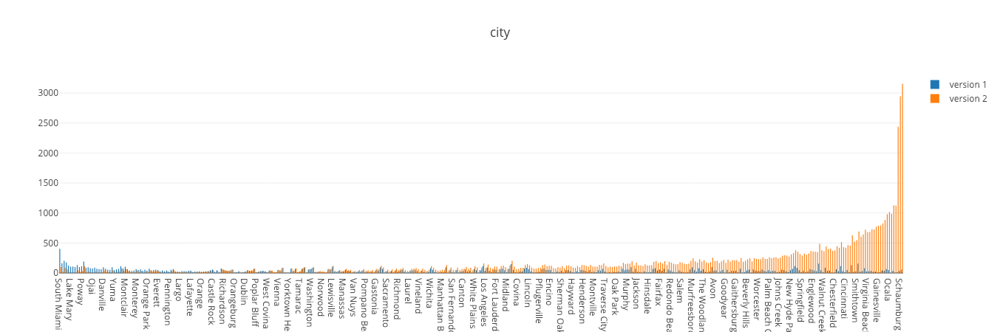

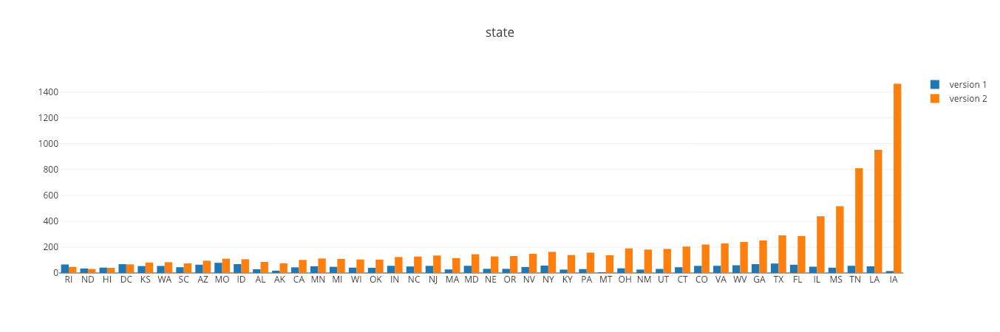

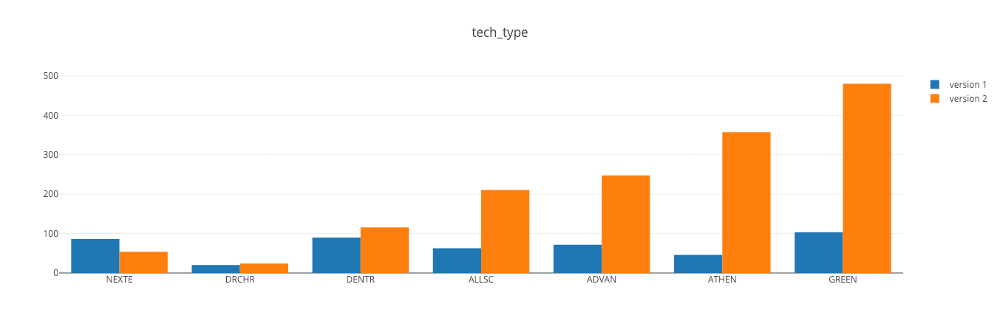

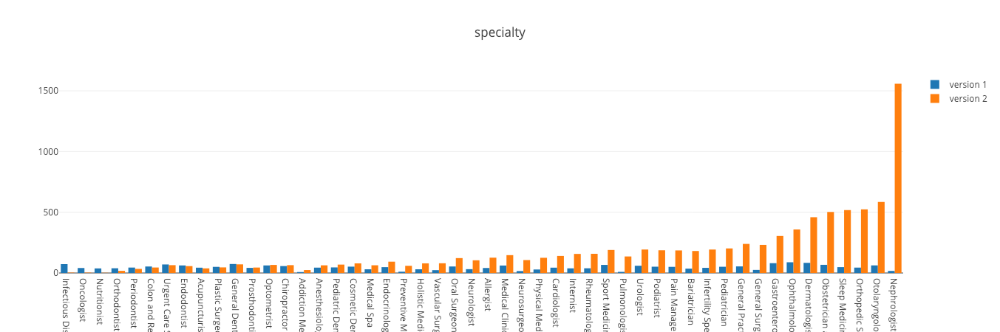

In [16]:
# these are the different attirbutes that certain version may be better in
cats = ['city', 'state', 'tech_type','specialty']
for cat in cats:
    q2(df,cat,'graph')

# QUESTION 3

# Do ratings change significantly with either “long” survey?

In [17]:
# ratings between versions
df_long.groupby('version').rating.mean()

version
v1    3.138456
v2    3.745240
Name: rating, dtype: float64

In [157]:
(3.75-3.14)/3.14

0.19426751592356684

# How would you predict which practices will have success, defined as at least a 0.3 star increase in their “long” survey average monthly rating vs their “short” survey average monthly rating?

In [19]:
# determine month
df['month'] = np.ceil((df.age+1)/30)

In [20]:
# get monthly rates for each practice 
rate = pd.pivot_table(df,index=['practice_id','month'],columns=['survey_type'],values='rating',aggfunc=np.mean).reset_index()
rate2 = rate.groupby('practice_id',as_index=False).mean()

In [ ]:
# does practice review improve from short to long?
rate2['improve'] = np.where(rate2.long>(rate2.short+0.3),1,0)
rate3 = rate2[['practice_id','improve']]

In [21]:
# practice that improved
rate2.head()

survey_type,practice_id,month,long,short,improve
0,2,7.666667,3.000000,5.000000,0
1,3,9.000000,4.031024,4.191395,0
2,5,6.000000,0.000000,5.000000,0
3,6,11.000000,3.237912,4.025000,0
4,7,11.500000,4.003381,4.779880,0


In [22]:
# merge rate with df
df2 = df[['practice_id', 'n_providers','n_providers_surveys','version', 'state', 'tech_type', 'specialty']].merge(rate3,on='practice_id').drop_duplicates().dropna()

In [23]:
# get dummies for categorical variables
cat = pd.DataFrame()

In [24]:
# get dummies for categorical variables
cat = pd.DataFrame()
columns = ['version','state','tech_type','specialty']

for col in columns:
    cat1 = pd.get_dummies(df2[col])
    cat = pd.concat([cat,cat1],axis=1)

In [25]:
# numerical cat
num = df2[['improve', 'n_providers', 'n_providers_surveys']]

In [26]:
df3 = pd.concat([num,cat],axis=1).astype(int)

## Random Forest

In [27]:
y = df3.improve
X = df3.drop('improve',axis=1)

In [28]:
from sklearn.ensemble import RandomForestClassifier

# Build the model
rfc = RandomForestClassifier()

# Fit the model
rfc.fit(X,y)

/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [29]:
rfc_features = pd.DataFrame(rfc.feature_importances_,index= X.columns).sort_values([0],ascending=False)

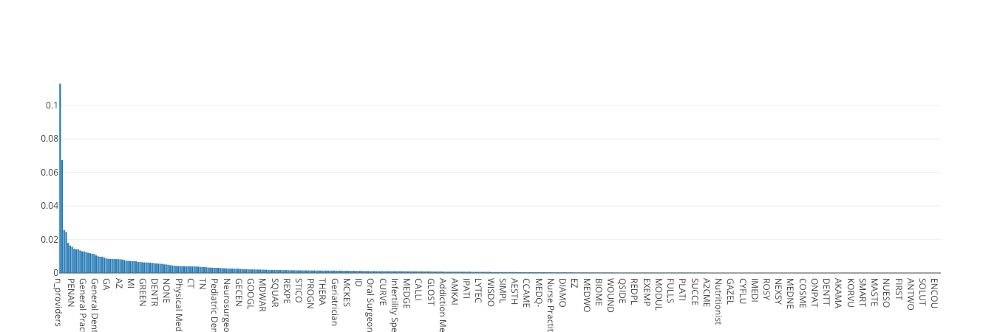

In [30]:
# Importance of each Feature 
data= [go.Bar(x=rfc_features.index,y=rfc_features[0])]
fig = go.Figure(data)
py.iplot(fig)

# Question 4

Would you recommend replacing the “short” survey with either (or both) of the “long” surveys for any or all practices? Provide reasons to support your answer. If you do not have enough data to make a recommendation, what additional data would you need?

In [31]:
# short vs long

In [144]:
q4 = pd.pivot_table(df,index='practice_id',columns='survey_type',aggfunc='count',fill_value=0)['review_id']

In [145]:
q4['ratio_1'] = q4.short/q4.long
q4['ratio_2'] = q4.long/q4.short

In [146]:
# don't include values with 0 for ratio
q4 = q4[(q4.long!=0)&(q4.short!=0)].sort_values('ratio_1')

In [147]:
q4['sort'] = np.arange(len(q4))

In [154]:
# cases where short surveys do better than long
q4.sort_values('sort',ascending=False).head(10)

survey_type,long,short,ratio_1,ratio_2,sort
practice_id,,,,,
11547,1,78,78.000000,0.012821,3363
15744,1,75,75.000000,0.013333,3362
15564,1,61,61.000000,0.016393,3361
13796,2,115,57.500000,0.017391,3360
15702,1,34,34.000000,0.029412,3359
14759,3,94,31.333333,0.031915,3358
12683,3,82,27.333333,0.036585,3357
15332,1,22,22.000000,0.045455,3356
15687,1,18,18.000000,0.055556,3355


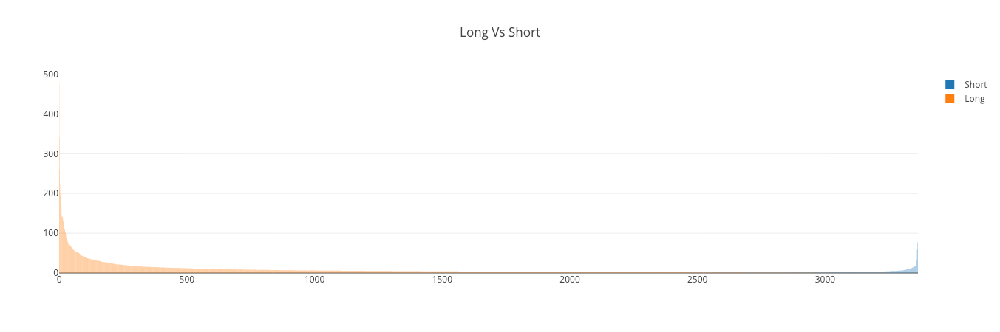

In [155]:
trace1 = go.Bar(x=q4.sort,y=q4.ratio_1,name='Short')
trace2 = go.Bar(x=q4.sort,y=q4.ratio_2,name='Long')
data= [trace1,trace2]
layout = go.Layout(title='Long Vs Short')
fig = go.Figure(data,layout)
py.iplot(fig)